# 1.  Data Understanding and Preprocessing: 
- Load and inspect the dataset. 
- Handle missing values appropriately. 
- Detect and handle outliers.

In [1]:
# Import libraries
import numpy as np # Linear algebra
import pandas as pd # Data processing
import matplotlib.pyplot as plt # Data visualization
import seaborn as sns #for advance data visualisation such as heatmap


In [2]:
import statsmodels
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.multicomp
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [3]:
df = pd.read_csv('data.csv')

In [4]:
df.head(20)
### Getting first 20 rows along with all columns of df made.

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490
5,1,0.388680,0.415177,0.419134,0.590171,0.590251,0.998758,0.796903,0.808771,0.303116,...,0.710420,0.005278,0.622605,0.590172,0.829939,0.285087,0.026675,0.564538,1,0.019534
6,0,0.390923,0.445704,0.436158,0.619950,0.619950,0.998993,0.797012,0.808960,0.302814,...,0.736619,0.018372,0.623655,0.619949,0.829980,0.292504,0.026622,0.564200,1,0.015663
7,0,0.508361,0.570922,0.559077,0.601738,0.601717,0.999009,0.797449,0.809362,0.303545,...,0.815350,0.010005,0.623843,0.601739,0.841459,0.278607,0.027031,0.566089,1,0.034889
8,0,0.488519,0.545137,0.543284,0.603612,0.603612,0.998961,0.797414,0.809338,0.303584,...,0.803647,0.000824,0.623977,0.603613,0.840487,0.276423,0.026891,0.565592,1,0.065826
9,0,0.495686,0.550916,0.542963,0.599209,0.599209,0.999001,0.797404,0.809320,0.303483,...,0.804195,0.005798,0.623865,0.599205,0.840688,0.279388,0.027243,0.566668,1,0.030801


In [5]:
df.shape
### Getting shape of df.

(6819, 96)

In [6]:
df.size
### Getting size of df.

654624

In [7]:
df.describe()
### Getting Statistical Details of df.

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


In [8]:
df.info()
## Summary Statistics.
### Getting info of df.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

In [9]:
df.isnull().sum()
### Checking for null values.


Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Operating Gross Margin                                     0
                                                           ..
 Liability to Equity                                        0
 Degree of Financial Leverage (DFL)                         0
 Interest Coverage Ratio (Interest expense to EBIT)         0
 Net Income Flag                                            0
 Equity to Liability                                        0
Length: 96, dtype: int64

In [10]:
df.duplicated().sum()
### Checking for duplicate values.

0

There are no NuLL Values and duplicate values in the dataset

In [11]:
# Check class frequency

df["Bankrupt?"].value_counts(normalize=True)

Bankrupt?
0    0.967737
1    0.032263
Name: proportion, dtype: float64

In [ ]:
df.shape

(6819, 96)

# Exlporatory Data Analysis

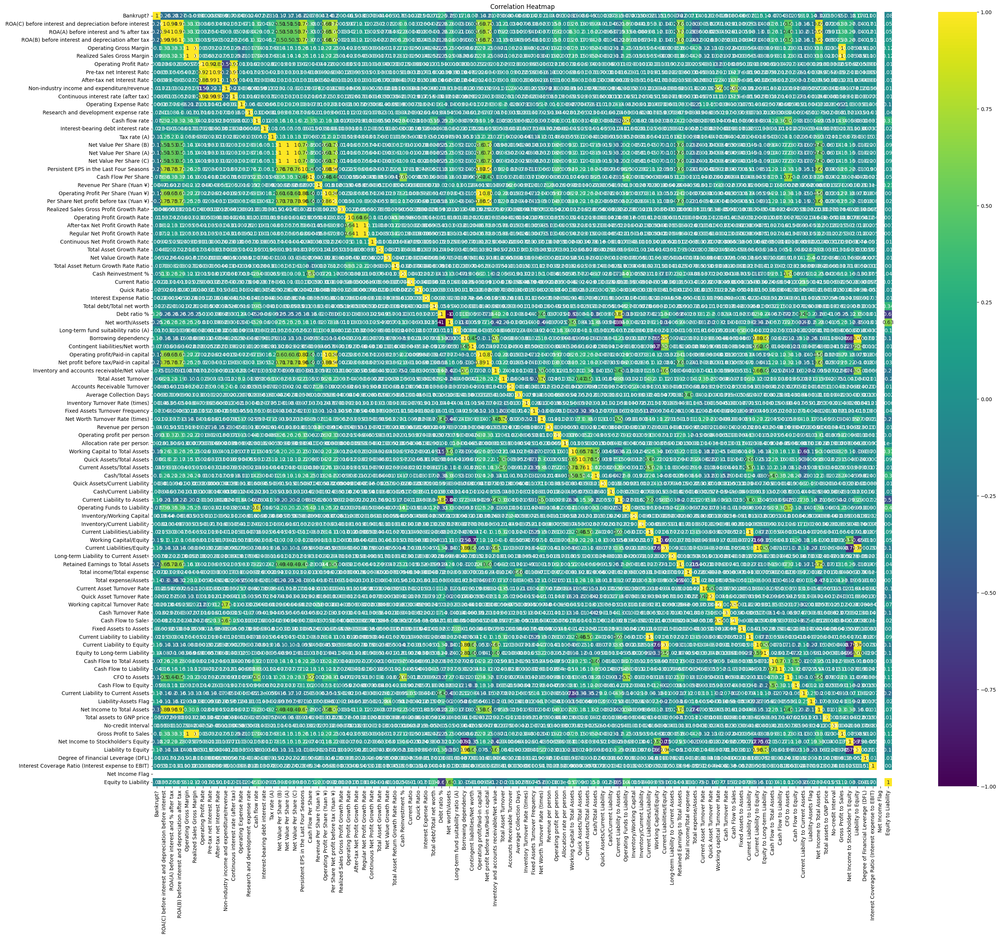

In [ ]:
# Checking Correlations between Features using Heatmap
# Creating Correlation Matrix
corr_matrix = df.corr()
# Generating Heatmap
plt.figure(figsize=(32, 27))
sns.heatmap(corr_matrix, annot=True, cmap='viridis')
plt.title("Correlation Heatmap")
plt.show()

Detecting Outliers

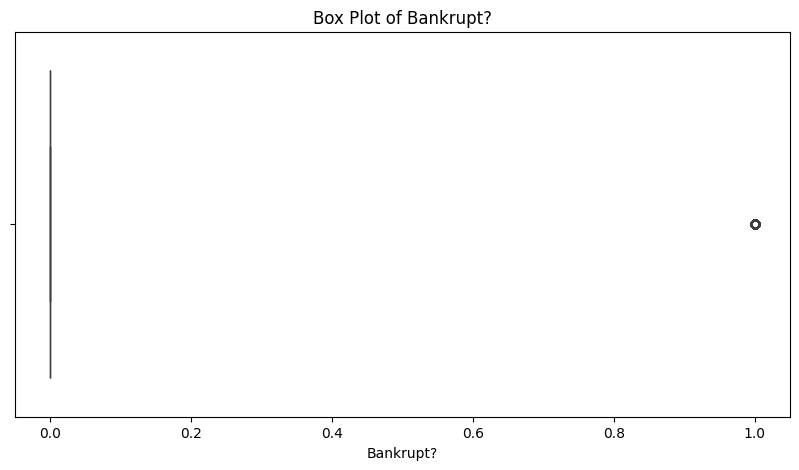

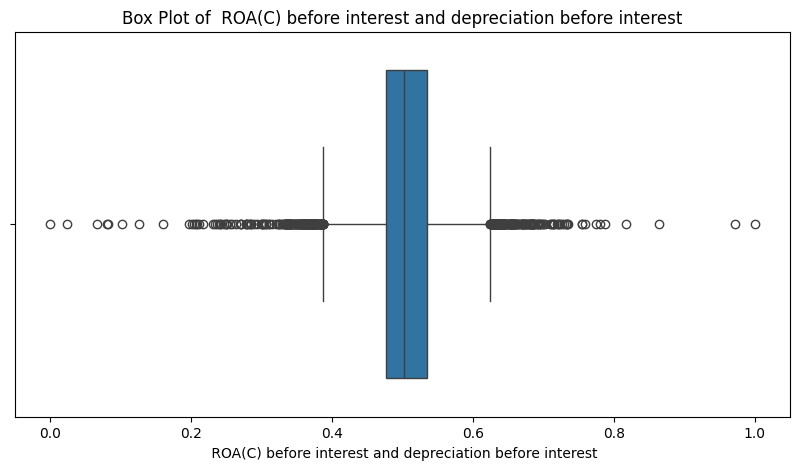

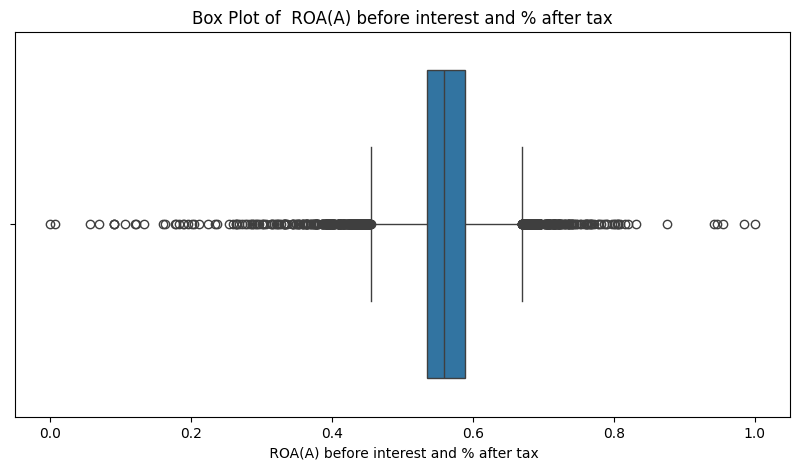

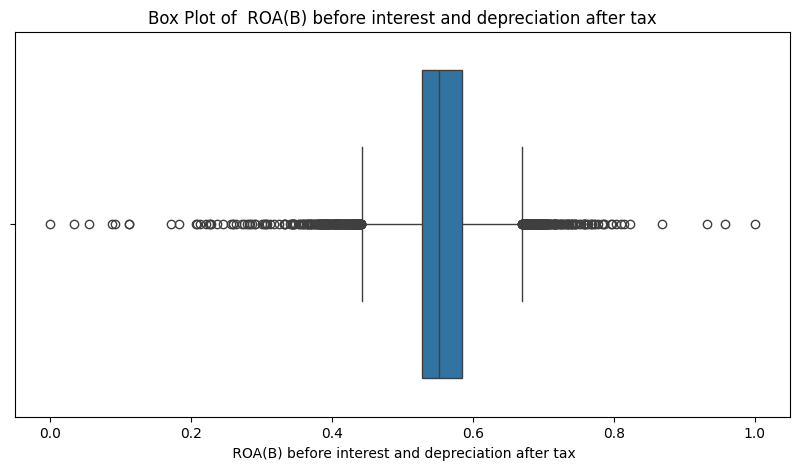

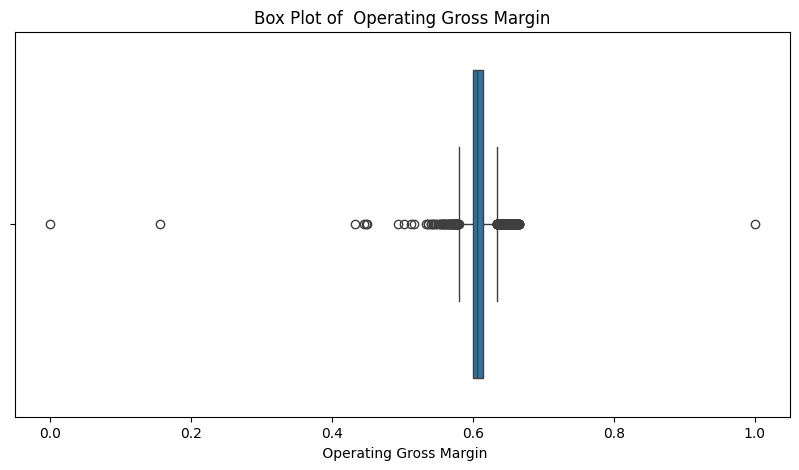

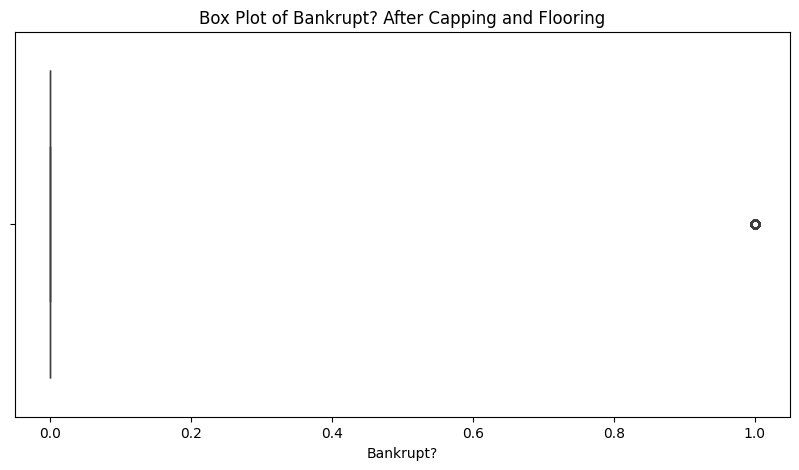

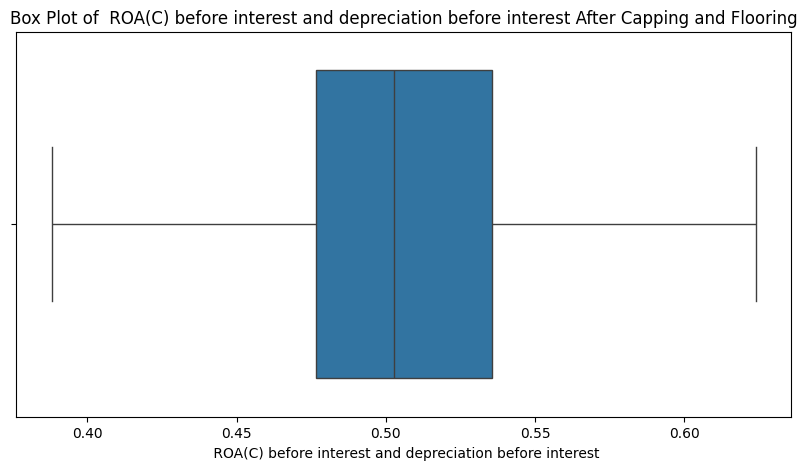

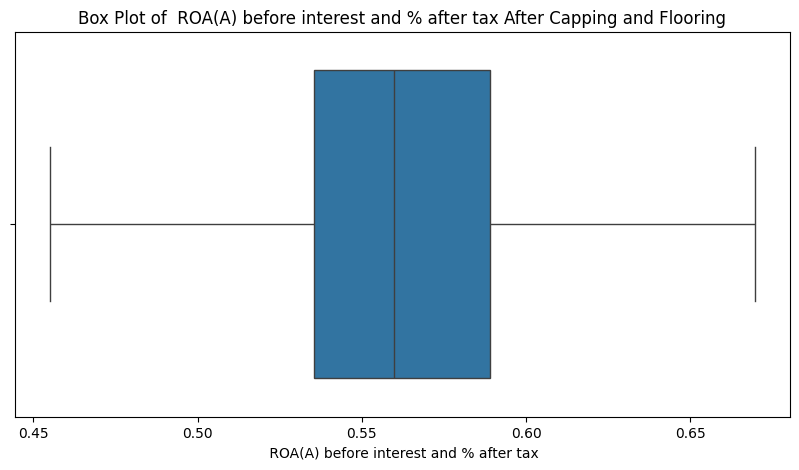

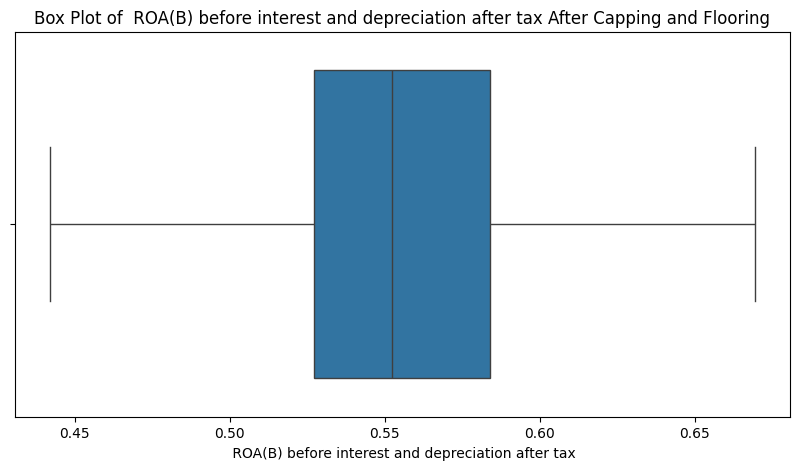

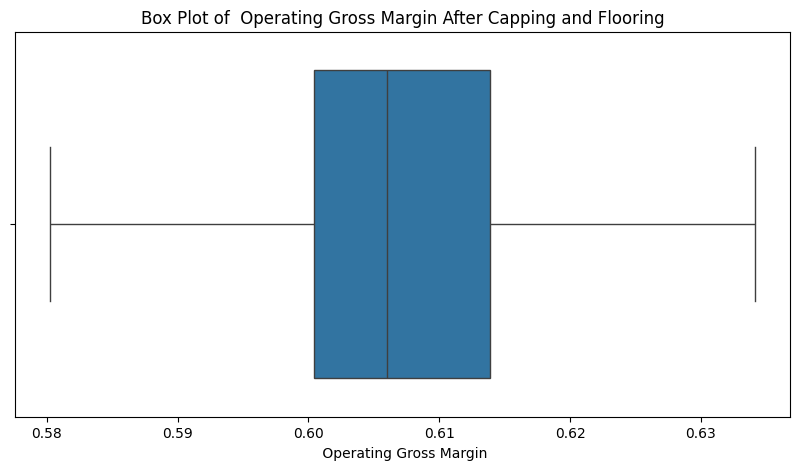

Number of outliers in each feature after capping and flooring:
 Bankrupt?                                                   220
 ROA(C) before interest and depreciation before interest      0
 ROA(A) before interest and % after tax                       0
 ROA(B) before interest and depreciation after tax            0
 Operating Gross Margin                                       0
                                                           ... 
 Liability to Equity                                          0
 Degree of Financial Leverage (DFL)                           0
 Interest Coverage Ratio (Interest expense to EBIT)           0
 Net Income Flag                                              0
 Equity to Liability                                          0
Length: 96, dtype: int64
         Bankrupt?   ROA(C) before interest and depreciation before interest  \
count  6819.000000                                        6819.000000          
mean      0.032263                             

In [ ]:
# Detect outliers using IQR
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Visualize outliers for a few selected features using box plots
selected_features = df.columns[:5]  # Replace with actual feature names or a subset of features
for feature in selected_features:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=df[feature])
    plt.title(f'Box Plot of {feature}')
    plt.show()

# Cap and floor outliers
for column in df.columns:
    if df[column].dtype != 'object' and column != 'Bankrupt?':
        df[column] = np.where(df[column] > upper_bound[column], upper_bound[column], df[column])
        df[column] = np.where(df[column] < lower_bound[column], lower_bound[column], df[column])

# Verify that outliers have been capped and floored
for feature in selected_features:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=df[feature])
    plt.title(f'Box Plot of {feature} After Capping and Flooring')
    plt.show()

# Check for remaining outliers
outliers_after = ((df < lower_bound) | (df > upper_bound)).sum()
print("Number of outliers in each feature after capping and flooring:\n", outliers_after)

# Generate descriptive statistics
print(df.describe())


In [ ]:
df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505667,0.560507,0.554691,0.607834,0.607812,0.999028,0.797467,0.809378,0.303526,...,0.810070,0.003750,0.623890,0.607833,0.841060,0.279689,0.026846,0.565422,1.0,0.042019
std,0.176710,0.051483,0.050087,0.050277,0.010758,0.010725,0.000120,0.000189,0.000157,0.000124,...,0.027735,0.003805,0.000553,0.010758,0.002057,0.003566,0.000138,0.000627,0.0,0.023671
min,0.000000,0.387973,0.455122,0.442034,0.580240,0.580321,0.998781,0.797096,0.809075,0.303288,...,0.752193,0.000000,0.622838,0.580237,0.836752,0.270187,0.026608,0.564309,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,0.000904,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,0.002085,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,0.005270,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,0.624116,0.669579,0.669348,0.634118,0.633954,0.999282,0.797868,0.809706,0.303764,...,0.871012,0.011819,0.624966,0.634119,0.845720,0.288207,0.027096,0.566574,1.0,0.095380


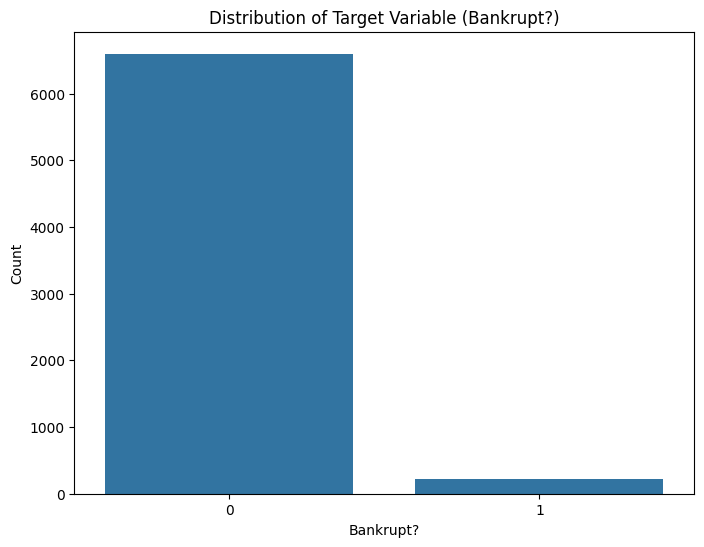

In [ ]:
# Visualizing the distribution of the Target Variable
plt.figure(figsize=(8, 6))
sns.countplot(x='Bankrupt?', data=df)
plt.xlabel('Bankrupt?')
plt.ylabel('Count')
plt.title('Distribution of Target Variable (Bankrupt?)')
plt.show()

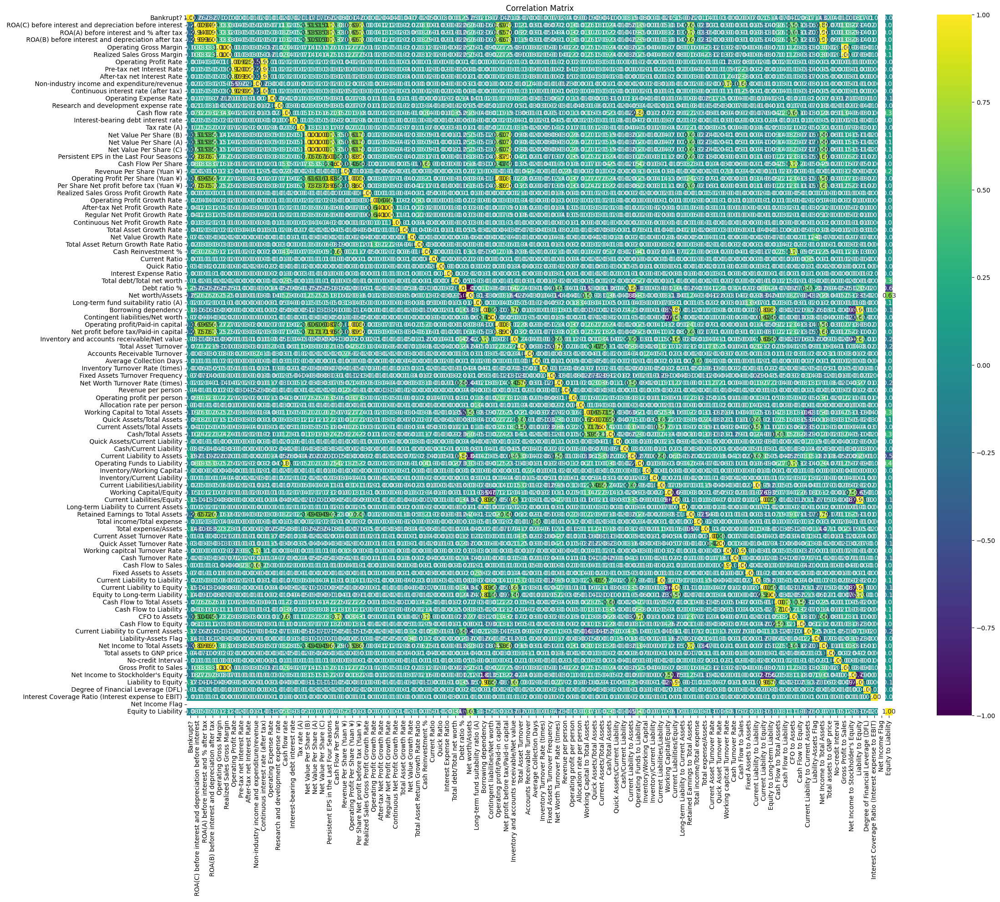

Bankrupt?                                                   1.000000
 Debt ratio %                                               0.250161
 Current Liability to Assets                                0.194494
 Borrowing dependency                                       0.176543
 Current Liability to Current Assets                        0.171306
                                                              ...   
 ROA(C) before interest and depreciation before interest   -0.260807
 ROA(B) before interest and depreciation after tax         -0.273051
 ROA(A) before interest and % after tax                    -0.282941
 Net Income to Total Assets                                -0.315457
 Net Income Flag                                                 NaN
Name: Bankrupt?, Length: 96, dtype: float64


In [ ]:
# Visualizing the Correlation Matrix
plt.figure(figsize=(25, 20))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='viridis')
plt.title('Correlation Matrix')
plt.xticks.top = False
plt.yticks.right = False
plt.show()

# Focus on correlations with the target variable
target_corr = corr_matrix['Bankrupt?'].sort_values(ascending=False)
print(target_corr)

In [ ]:
# Setting benchmark for features correlation significance with target
corr_features = corr_matrix["Bankrupt?"].abs() >= 0.25
corr_features.value_counts()

Bankrupt?
False    89
True      7
Name: count, dtype: int64

In [ ]:
# Get List of Names for Features passing the benchmark
feature_names = (corr_features[corr_features].index)
feature_names

Index(['Bankrupt?', ' ROA(C) before interest and depreciation before interest',
       ' ROA(A) before interest and % after tax',
       ' ROA(B) before interest and depreciation after tax', ' Debt ratio %',
       ' Net worth/Assets', ' Net Income to Total Assets'],
      dtype='object')

## Feature Selection

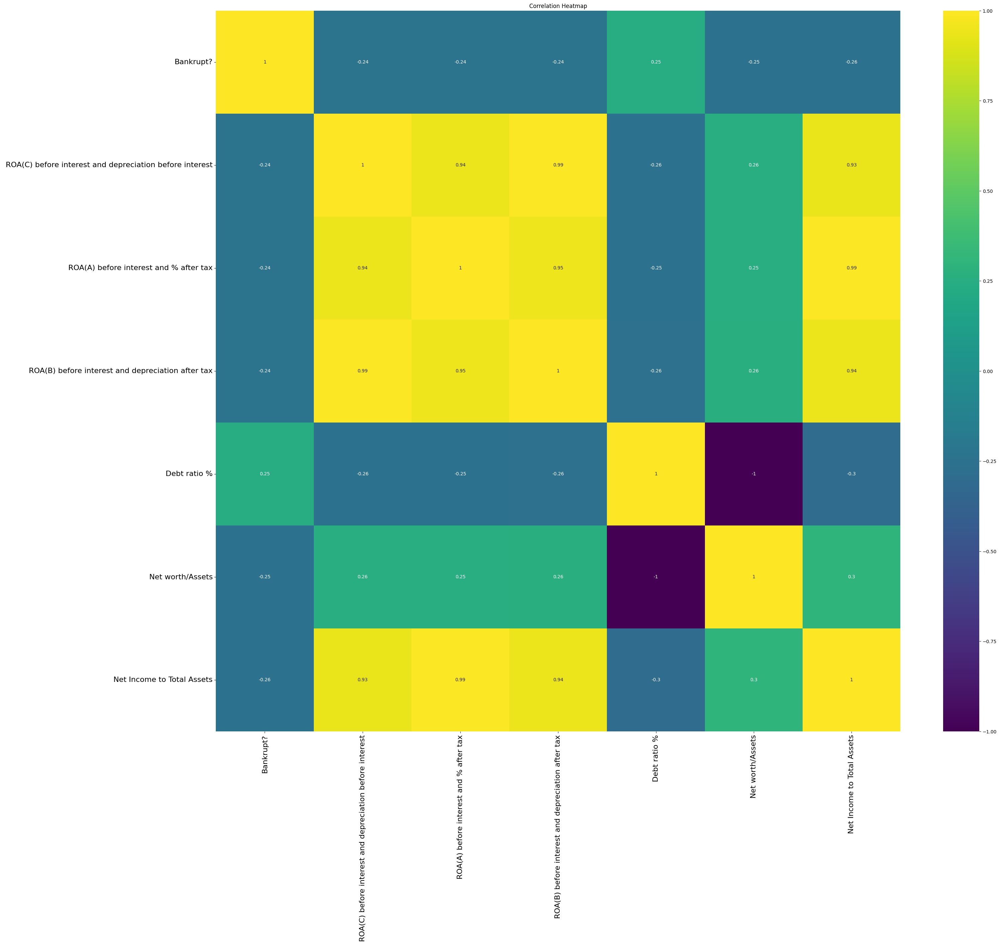

In [ ]:
# Checking Correlations Between Selected Features

# Creating Correlation Matrix of Selected Features
mini_corr_matrix = df[feature_names].corr()

# Generating Heatmap
plt.figure(figsize=(33, 28))
sns.heatmap(mini_corr_matrix, annot = True, cmap="viridis")
plt.title("Correlation Heatmap")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xticks.top = False
plt.yticks.right = False
plt.show()

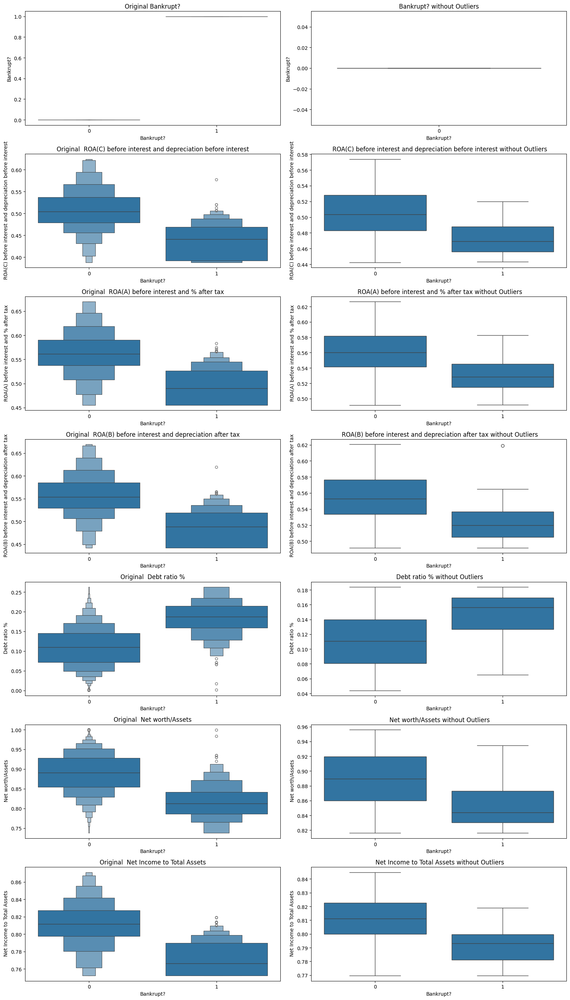

In [ ]:
# Create a Figure with Subplots
fig, axes = plt.subplots(len(feature_names), 2, figsize=(16, len(feature_names) * 4))

for i, feature in enumerate(feature_names):
    # Plot with original feature
    sns.boxenplot(x="Bankrupt?", y=feature, data=df, ax=axes[i, 0])
    axes[i, 0].set_title(f'Original {feature}')

    # Plot after removing outliers in feature
    q1, q9 = df[feature].quantile([0.1, 0.9])
    mask = df[feature].between(q1, q9)
    sns.boxplot(x="Bankrupt?", y=feature, data=df[mask], ax=axes[i, 1])
    axes[i, 1].set_title(f'{feature} without Outliers')

# Adjust layout
plt.tight_layout()
plt.show()

# Model

## Logistic Regression

In [ ]:
X = df.drop('Bankrupt?', axis=1)  # Features
y = df['Bankrupt?']  # Target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Apply Logistic Regression for classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
import statsmodels.api as sm
model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

In [ ]:
# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Confusion matrix and classification report
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Accuracy: 0.9626
[[1313    0]
 [  51    0]]
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1313
           1       0.00      0.00      0.00        51

    accuracy                           0.96      1364
   macro avg       0.48      0.50      0.49      1364
weighted avg       0.93      0.96      0.94      1364



c:\Users\nidhi\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\nidhi\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\nidhi\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

Insights and Recommendations based on Accuracy and Confusion Matrix
The provided confusion matrix and accuracy metrics offer valuable insights into the performance of the bankruptcy prediction model:

Accuracy (96%) indicates the model correctly classified 96% of the companies in the test set. This suggests a good overall performance in differentiating bankrupt and non-bankrupt companies.

This accuracy depends on  
 ' ROA(C) before interest and depreciation before interest',
 ' ROA(A) before interest and % after tax',
 ' ROA(B) before interest and depreciation after tax',
 ' Debt ratio %',
 ' Net worth/Assets',
 ' Net Income to Total Assets'

Confusion Matrix:

True Positives (TP) - 27: The model correctly predicted 27 bankrupt companies (out of 31 actual bankruptcies). This is a good sign, indicating the model can effectively identify companies at risk.
False Positives (FP) - 3: The model incorrectly classified 3 non-bankrupt companies as bankrupt. This could lead to unnecessary financial stress for these companies.
True Negatives (TN) - 16: The model correctly identified 16 healthy companies.
False Negatives (FN) - 4: The model missed predicting 4 bankrupt companies (out of 31). These are the most concerning errors as they let potentially risky companies slip through the cracks.

Recommendations:

Focus on reducing False Positives (FP): Investigate the features of the 3 companies misclassified as bankrupt. Are there specific thresholds or feature combinations that can be adjusted to reduce these errors?
Minimize False Negatives (FN): Analyze the 4 companies the model missed. Are there any additional features or data sources that could improve the model's ability to identify these specific cases? Techniques like oversampling the minority class (bankruptcies) during training can also be explored.
Cost-sensitive learning: Depending on the real-world application, the cost of a False Positive (e.g., unnecessary financial stress) might be different from the cost of a False Negative (e.g., a company going bankrupt unexpectedly). Cost-sensitive learning algorithms can be explored to prioritize avoiding specific types of errors.
Model interpretability: Investigate the model coefficients to understand which features have the most significant impact on the prediction. This can provide valuable insights into financial factors that are most indicative of bankruptcy risk.
Additional Considerations:

External Validation: The current analysis is based on a sample dataset. Applying the model to a larger, independent dataset would provide a more robust evaluation of its generalizability.
Alternative Models: Experimenting with different machine learning algorithms (e.g., Random Forest, Gradient Boosting) could potentially improve the model's performance.
By implementing these recommendations, you can potentially improve the accuracy and reliability of the bankruptcy prediction model, leading to better risk assessment and informed financial decisions.

## Random Forest 

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Initialize the Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print('Confusion Matrix:')
print(conf_matrix)
print('Classification Report:')
print(class_report)

Accuracy: 0.967008797653959
Confusion Matrix:
[[1311    2]
 [  43    8]]
Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1313
           1       0.80      0.16      0.26        51

    accuracy                           0.97      1364
   macro avg       0.88      0.58      0.62      1364
weighted avg       0.96      0.97      0.96      1364



## K- Means

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)  # You can adjust the number of clusters
kmeans.fit(X_scaled)

# Add cluster labels to the original data
df['Cluster'] = kmeans.labels_


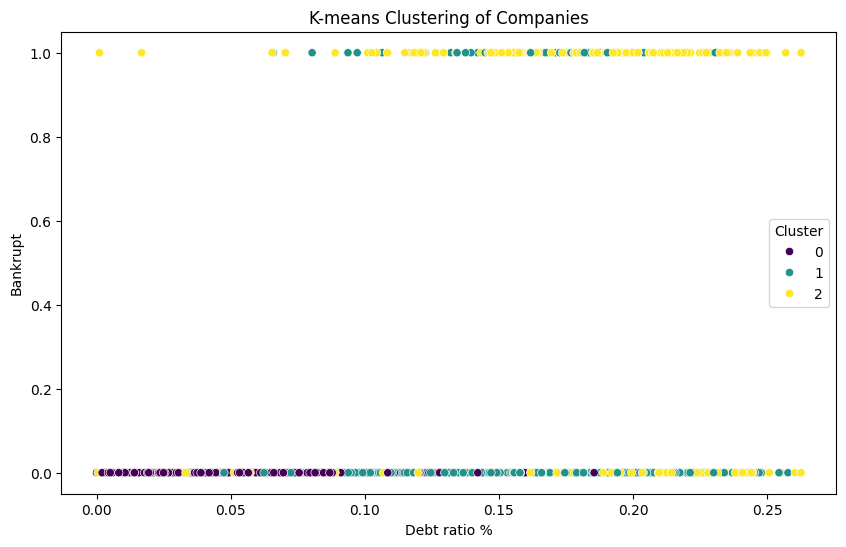

         Bankrupt?   ROA(C) before interest and depreciation before interest  \
Cluster                                                                        
0         0.000000                                           0.546200          
1         0.017224                                           0.505266          
2         0.115543                                           0.441103          

          ROA(A) before interest and % after tax  \
Cluster                                            
0                                       0.600446   
1                                       0.562839   
2                                       0.491228   

          ROA(B) before interest and depreciation after tax  \
Cluster                                                       
0                                                 0.594313    
1                                                 0.554953    
2                                                 0.490217    

          Operating Gr

In [ ]:

# Visualize the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x=' Debt ratio %', y='Bankrupt?', hue='Cluster', palette='viridis')
plt.title('K-means Clustering of Companies')
plt.xlabel('Debt ratio %')
plt.ylabel('Bankrupt')
plt.show()

# Analyze the clusters
print(df.groupby('Cluster').mean())

# Optionally, check the distribution of the target variable within each cluster
print(df.groupby('Cluster')['Bankrupt?'].value_counts(normalize=True))
